# Computo distribuido, uso de clusters y dask.

Dask divide los arrays en muchas pequeñas piezas, llamadas `chunks`, cada una de las cuales se asume es lo suficientemente pequeña para almacenarse en memoria.

A diferencia de Numpy, que se ejecuta de manera inmediata, los array de Dask son `lazy`. Las operaciones se ponen en cola, acumulando tareas, y ninguna operación se ejecuta hasta que literalmente pides que los valores sean calculados (ej. mostrar los resultados en pantalla (`print` o `plot`), o escribir al disco). En este punto, los datos son cargados en memoria, y los cálculos se ejecutan en bloque, usando los `chunks`.

Es importante notar que xarray solo hace uso de `dask.array` y `dask.delayed`. Para otras funcionalidades de dask, sería necesario transformar el `xarray` a un `dask.array`.

Este notebook revisaremos como levantar y usar un cluster, para esto nos enfocaremos en:
* Ejecutar trabajos sin cluster, en un cluster local, y en un cluster real.
* Utilizar `compute`, `load` y `persist`.

En primer lugar cargamos las librerías requeridas

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import xarray as xr
import rasterio as rio
import rioxarray
import datacube
import dask.array as da
import datetime

In [2]:
from odc.ui import DcViewer
from datacube.utils import masking
from datacube.utils.rio import configure_s3_access
from dask.distributed import Client, LocalCluster
from dask_gateway import Gateway

## Sin cluster

Al decidir correr Dask sin alguna configuración de cluster, Dask usará los threads de tu máquina local por defecto.

Esto se vería de la siguiente forma en la configuración de acceso a s3:

In [3]:
configure_s3_access(aws_unsigned=False, requester_pays=True)

Luego, ejecutamos las siguientes celdas que nos calcularán el NDVI promedio mensual en 5 años de datos `landsat8_c2l2_sr`.

In [4]:
dc = datacube.Datacube(app='Cluster_tutorial') 

In [5]:
query = {
    "product": "landsat8_c2l2_sr",
    "y": (-33.75, -33.25), 
    "x": (-70.75, -70.25),
    "time": ("2018-01-01", "2023-12-31"),
    "output_crs": "EPSG:32719",
    "resolution": (-30, 30),
    "dask_chunks": {"time": 1, 'x':512, 'y':512},
    "group_by": "solar_day"
}
good_pixel_flags = {
    #"snow": "not_high_confidence",
    "cloud": "not_high_confidence",
    "cirrus": "not_high_confidence",
    "cloud_shadow": "not_high_confidence",
    "nodata": False
}

In [6]:
ds = dc.load(**query)

bandas_reflectancia = ["coastal", "blue", "green", "red", "nir08", "swir16", "swir22"]
quality_band = 'qa_pixel'
cloud_free_mask1 = masking.make_mask(ds[quality_band], **good_pixel_flags)
dsf = ds[bandas_reflectancia].where(cloud_free_mask1)

dsf.update(dsf * 0.0000275 + -0.2)
dsf.update(dsf.where(dsf >= 0).where(dsf <= 1))

dsf

<xarray.Dataset>
Dimensions:      (time: 266, y: 1871, x: 1576)
Coordinates:
  * time         (time) datetime64[ns] 2018-01-04T14:33:48.433629 ... 2023-12...
  * y            (y) float64 6.32e+06 6.32e+06 6.32e+06 ... 6.264e+06 6.264e+06
  * x            (x) float64 3.37e+05 3.37e+05 3.37e+05 ... 3.842e+05 3.842e+05
    spatial_ref  int32 32719
Data variables:
    coastal      (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    blue         (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    green        (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    red          (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    nir08        (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    swir16       (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    swir22       (time, y, x) float32 dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
Attributes:
    crs:           EPSG:32719
    grid_mapping:  spatial_ref

In [7]:
ndvi = (dsf['nir08'] - dsf['red']) / (dsf['nir08'] + dsf['red'])
ndvi.attrs = ds['red'].attrs  # para mantener atributos geoespaciales
ndvi = ndvi.where(ndvi >= -1).where(ndvi <= 1)

In [8]:
ndvi_monthly = ndvi.groupby('time.month').mean(dim = "time", skipna = True)

In [9]:
ndvi_monthly

<xarray.DataArray (month: 12, y: 1871, x: 1576)>
dask.array<stack, shape=(12, 1871, 1576), dtype=float32, chunksize=(1, 512, 512), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 6.32e+06 6.32e+06 6.32e+06 ... 6.264e+06 6.264e+06
  * x            (x) float64 3.37e+05 3.37e+05 3.37e+05 ... 3.842e+05 3.842e+05
    spatial_ref  int32 32719
  * month        (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Attributes:
    units:         reflectance
    nodata:        0
    crs:           EPSG:32719
    grid_mapping:  spatial_ref

/env/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(


datetime.timedelta(seconds=70, microseconds=319824)

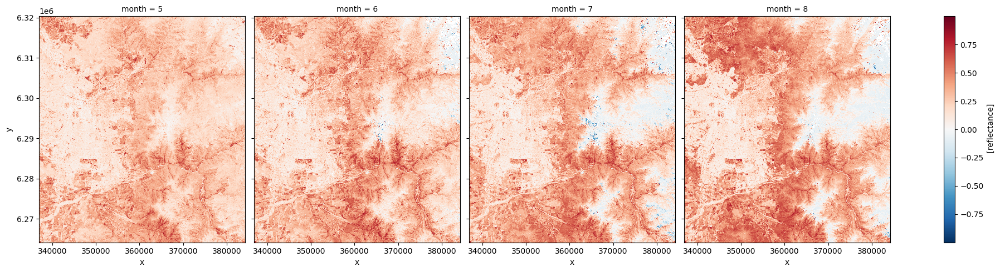

In [10]:
ti = datetime.datetime.now()
ndvi_monthly.isel(month = [4,5,6,7]).plot(col = "month", figsize = (20, 5))
tf = datetime.datetime.now()
tf-ti

Vemos que tomó aproximadamente 60 segundos en graficar la información requerida.

***

## Cluster local

Si decidimos utilizar un cluster local, Dask creará un cluster usando la máquina ya levantada en Data Cube Chile. Esto dará acceso a la computación multiproceso y a tableros de diagnostico.

El cluster local es fácil de usar y funciona bien en una sola máquina. Sigue la misma interfaz que los otros Cluster de Dask y, por ende, hace sencillo cambiar a un Cluster real cuando estés listo para escalar.

Utilizaremos el siguiente código para configurar un cluster local:

In [14]:
cluster = LocalCluster()
#cluster.adapt(minimum=6, maximum=16)
cluster.scale(4)

client = Client(cluster)
configure_s3_access(aws_unsigned=False, requester_pays=True, client = client)

In [15]:
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:38103/status,
Dashboard: http://127.0.0.1:38103/status,Workers: 4
Total threads: 8,Total memory: 29.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:37543,Workers: 4
Dashboard: http://127.0.0.1:38103/status,Total threads: 8
Started: Just now,Total memory: 29.00 GiB
Comm: tcp://127.0.0.1:33781,Total threads: 2
Dashboard: http://127.0.0.1:33903/status,Memory: 7.25 GiB
Nanny: tcp://127.0.0.1:38815,


el comando `cluster` nos da acceso consultar el número de workers, threads, y memoria total que se está utilizando en el cluster local.

In [13]:
cluster

LocalCluster(24b57746, 'tcp://127.0.0.1:38379', workers=4, threads=8, memory=29.00 GiB)

Para ver el tablero de diagnóstico es necesario acceder al siguiente enlace, cambiando el `USERNAME` por su nombre de usuario a Data Cube Chile, y fijandose de que el puerto (8787 en este caso) sea el que está utilizando el `cluster`

https://hub.datacubechile.cl/user/USERNAME/proxy/8787/status

Accediendo al tablero podremos ver como se ejecutan las tareas al usar `compute`, `load` o `persist`.

In [16]:
ndvi_monthly

<xarray.DataArray (month: 12, y: 1871, x: 1576)>
dask.array<stack, shape=(12, 1871, 1576), dtype=float32, chunksize=(1, 512, 512), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 6.32e+06 6.32e+06 6.32e+06 ... 6.264e+06 6.264e+06
  * x            (x) float64 3.37e+05 3.37e+05 3.37e+05 ... 3.842e+05 3.842e+05
    spatial_ref  int32 32719
  * month        (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Attributes:
    units:         reflectance
    nodata:        0
    crs:           EPSG:32719
    grid_mapping:  spatial_ref

Utilizamos `.compute()` o `.load()` cuando queremos los resultados de un como un xarray.DataArray con datos almacenados como arrays de NumPy. 

Esto implica almacenar la información en la memoria de un solo worker, por lo que es recomendable cuando el resultado requerido es pequeño.

En este caso utilizaremos `load`, midiendo el tiempo que toma para generar un plot.

/env/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(
/env/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(
/env/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(
/env/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(


datetime.timedelta(seconds=171, microseconds=595881)

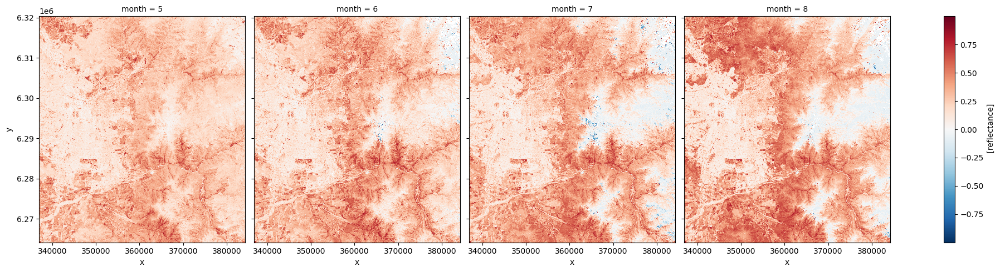

In [17]:
ti = datetime.datetime.now()
ndvi_monthly.load()
ndvi_monthly.isel(month = [4,5,6,7]).plot(col = "month", figsize = (20, 5))
tf = datetime.datetime.now()
tf-ti

Tardamos aproximadamente 200 segundos en generar el plot. Esto es mayor al caso sin usar `compute` o `load`. Sin embargo, el beneficio es que ahora podemos graficar todos los meses en cuestión de pocos segundos.

datetime.timedelta(seconds=3, microseconds=37941)

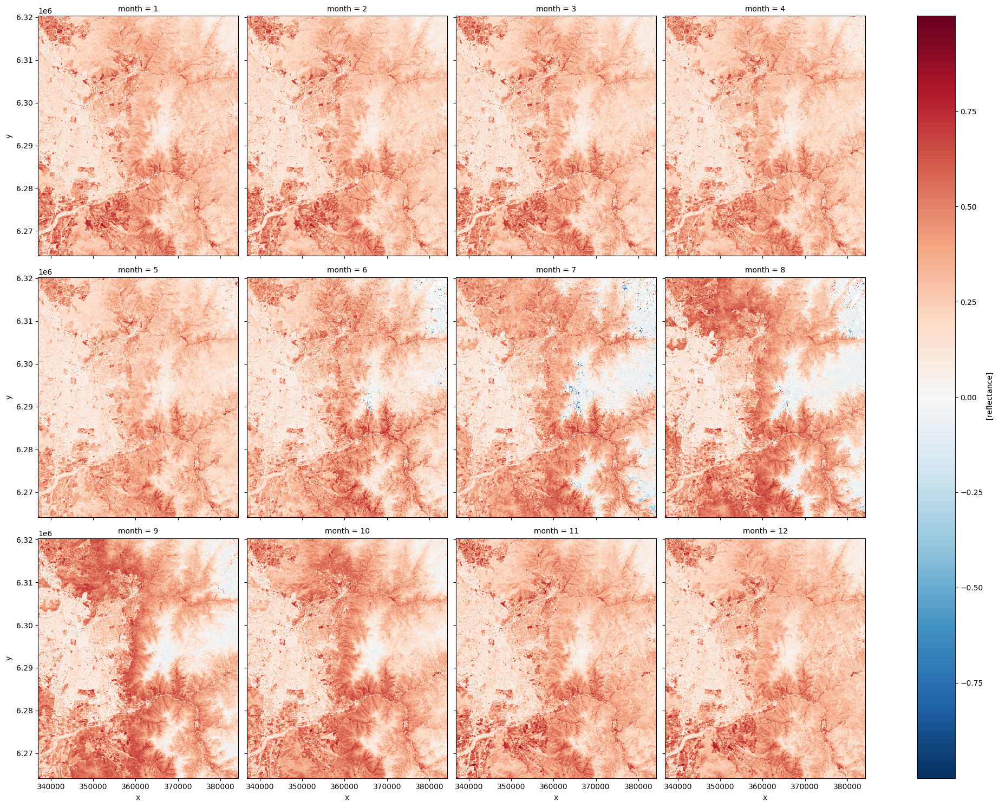

In [18]:
ti = datetime.datetime.now()
ndvi_monthly.plot(col = "month", col_wrap = 4, figsize = (20, 15))
tf = datetime.datetime.now()
tf-ti

Esta diferencia se debe a que el objeto `ndvi_monthly` pasó de ser `lazzy` a estar disponible como un array de NumPy en memoria, por ende, no es necesario volver a ejecutar los procesos de limpieza, calculo de NDVI y media temporal cada vez que queramos graficarlo.
Si exploramos ndvi_monthly vemos que ya no tiene `chunks`, sino que nos muestra los valores del array.

In [19]:
ndvi_monthly

<xarray.DataArray (month: 12, y: 1871, x: 1576)>
array([[[ 0.61512405,  0.6093569 ,  0.6070221 , ...,  0.04225304,
          0.02071511, -0.09782757],
        [ 0.604829  ,  0.6020435 ,  0.61501366, ...,  0.035271  ,
          0.03728057, -0.11870304],
        [ 0.5900245 ,  0.60280955,  0.60302585, ...,  0.03043289,
          0.05358203,  0.0397218 ],
        ...,
        [ 0.5679947 ,  0.5363778 ,  0.5375626 , ...,  0.38085705,
          0.36589545,  0.37436515],
        [ 0.5662019 ,  0.5272906 ,  0.539649  , ...,  0.398196  ,
          0.38971138,  0.36542913],
        [ 0.6205318 ,  0.54323757,  0.5478524 , ...,  0.36687383,
          0.3878812 ,  0.36904842]],

       [[ 0.61276734,  0.6093607 ,  0.5970401 , ...,  0.03203324,
          0.02552259, -0.07276404],
        [ 0.6461563 ,  0.64003855,  0.63713604, ...,  0.03052897,
          0.04405982, -0.1358614 ],
        [ 0.6231526 ,  0.61850166,  0.60514104, ...,  0.03647761,
          0.04355115,  0.02924522],
...
        [ 0.6631107 ,  0.646902  ,  0.65837353, ...,  0.41882563,
          0.40587324,  0.40705332],
        [ 0.6606182 ,  0.6449448 ,  0.65918374, ...,  0.43985838,
          0.43238616,  0.40631205],
        [ 0.6984346 ,  0.67435735,  0.6795076 , ...,  0.4148447 ,
          0.43813807,  0.41578442]],

       [[ 0.6101133 ,  0.5868077 ,  0.5834932 , ...,  0.02403762,
          0.02789611, -0.07325441],
        [ 0.5821676 ,  0.57835054,  0.5978595 , ...,  0.01779472,
         -0.0053275 , -0.09174512],
        [ 0.56714624,  0.5924705 ,  0.5900554 , ..., -0.01573958,
          0.02645909, -0.02084629],
        ...,
        [ 0.6458256 ,  0.6497436 ,  0.6695955 , ...,  0.41311932,
          0.40066624,  0.4001367 ],
        [ 0.63687944,  0.6467026 ,  0.673352  , ...,  0.42476678,
          0.4243234 ,  0.39639434],
        [ 0.675678  ,  0.66681767,  0.68682456, ...,  0.40246058,
          0.42681527,  0.40518272]]], dtype=float32)
Coordinates:
  * y            (y) float64 6.32e+06 6.32e+06 6.32e+06 ... 6.264e+06 6.264e+06
  * x            (x) float64 3.37e+05 3.37e+05 3.37e+05 ... 3.842e+05 3.842e+05
    spatial_ref  int32 32719
  * month        (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Attributes:
    units:         reflectance
    nodata:        0
    crs:           EPSG:32719
    grid_mapping:  spatial_ref

***

## Cluster real

Un cluster es un conjunto de computadores que trabajan juntos de tal manera que pueden ser vistos como un solo sistema. Cada nodo ejecuta una tarea controlada y programada por un software (Dask en este caso).

Utilizaremos el siguiente código para levantar un cluster:

In [20]:
gateway = Gateway()
cluster = gateway.new_cluster()
cluster.scale(5)

client = Client(cluster)
configure_s3_access(aws_unsigned=False, requester_pays=True, client = client)

In [21]:
client

Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: https://hub.datacubechile.cl/services/dask-gateway/clusters/easihub.b189dd3612a24610a76d073585baa8e6/status,


En cluster real podemos acceder al tablero de diagnóstico a través del enlace en **Dashboard** al ejecutar `client`.

In [33]:
cluster

Si `cluster` dice 0 workers, 0 threads y 0 Memory significa que aún no ha levantado las máquinas requeridas. 

Recomendamos volver a correr la celda luego de un tiempo, asegurandonos de que el cluster tiene recursos disponibles.

Exploraremos esta vez el objeto `ndvi`, que observamos sigue siendo `lazy` pese a que ya fue calculado al usar `compute` o `load` sobre ndvi_monthly.

In [25]:
ndvi

<xarray.DataArray (time: 266, y: 1871, x: 1576)>
dask.array<where, shape=(266, 1871, 1576), dtype=float32, chunksize=(1, 512, 512), chunktype=numpy.ndarray>
Coordinates:
  * time         (time) datetime64[ns] 2018-01-04T14:33:48.433629 ... 2023-12...
  * y            (y) float64 6.32e+06 6.32e+06 6.32e+06 ... 6.264e+06 6.264e+06
  * x            (x) float64 3.37e+05 3.37e+05 3.37e+05 ... 3.842e+05 3.842e+05
    spatial_ref  int32 32719
Attributes:
    units:         reflectance
    nodata:        0
    crs:           EPSG:32719
    grid_mapping:  spatial_ref

Podemos hacer `persist` en `ndvi` para dejarlo disponible para futuros cálculos.

Solo es recomendable hacer `persist` si tienes RAM disponible para almacenar estos datos. Hacer persist permite que los computos futuros sean más rápidos al pre-ejecutarlos.

Al hacer persist, el objeto sigue siendo `lazy`, pero queda cargado en la memoria distribuida a través de las máquinas del cluster. Esto es mucho más rápido que leer los datos continuamente desde el disco.

> **Advertencia:** Al usar `persist` en una sola máquina, este intentará cargar tus datos a memoria. Debes asegurarte de que el conjunto de datos a cargar en memoria no sea mayor a la memoria disponible.


In [34]:
ndvi2 = ndvi.persist()

Si observamos el tablero vemos como se ejecutan las distintas tareas para calcular ndvi. Sin embargo, aún podemos correr celdas en el jupyter notebook sin problemas.

Si corremos `ndvi2` habiendo terminado de ejecutar el persist en el dashboard, podemos observar que este sigue siendo `lazy`

In [37]:
ndvi2

<xarray.DataArray (time: 266, y: 1871, x: 1576)>
dask.array<where, shape=(266, 1871, 1576), dtype=float32, chunksize=(1, 512, 512), chunktype=numpy.ndarray>
Coordinates:
  * time         (time) datetime64[ns] 2018-01-04T14:33:48.433629 ... 2023-12...
  * y            (y) float64 6.32e+06 6.32e+06 6.32e+06 ... 6.264e+06 6.264e+06
  * x            (x) float64 3.37e+05 3.37e+05 3.37e+05 ... 3.842e+05 3.842e+05
    spatial_ref  int32 32719
Attributes:
    units:         reflectance
    nodata:        0
    crs:           EPSG:32719
    grid_mapping:  spatial_ref

Hacemos `persist` a `ndvi_monthly2`

In [36]:
ndvi_monthly2 = ndvi2.groupby('time.month').mean(dim = "time", skipna = True).persist()

Y revisamos cuanto demora hacer el plot una vez el cómputo del persist esté listo.

datetime.timedelta(seconds=3, microseconds=572565)

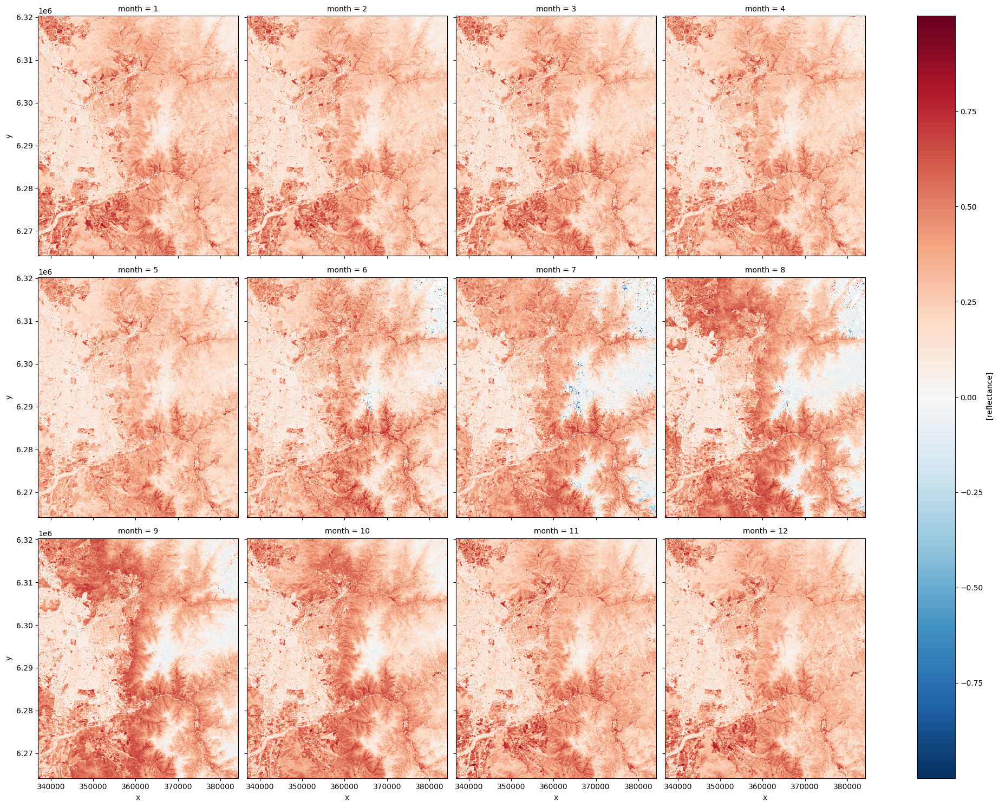

In [38]:
ti = datetime.datetime.now()
ndvi_monthly2.plot(col = "month", col_wrap = 4, figsize = (20, 15))
tf = datetime.datetime.now()
tf-ti

***

Dejamos las siguientes celdas de código para que puedan utilizarla en cualquier notebook o script, simplemente cambiando `cluster_method`

***
Recuerden cerrar el cluster

In [39]:
client.close()

In [40]:
cluster.close()

In [41]:
cluster.shutdown()

***
## Referencias: 
* https://docs.xarray.dev/en/stable/user-guide/dask.html
* https://examples.dask.org/xarray.html#Persist-data-in-memory